In [2]:
import glob
import pandas as pd
import numpy
import matplotlib.pyplot as plt
from pandas.plotting import table
from PIL import Image, ExifTags
import os

In [3]:
df_original = pd.read_excel("training_files_original.xlsx", index_col=0)
df_original['split_filename'] = [f.split(".")[0] for f in df_original['original_filename']]
df_original

,original_filename,safetowalk,timetowalk,split_filename
1,IMG_20210604_154122.jpg,0,11.4,IMG_20210604_154122
2,IMG_20210604_154118.jpg,0,11.4,IMG_20210604_154118
3,IMG_20210604_154047.jpg,1,11.4,IMG_20210604_154047
4,IMG_20210604_154021.jpg,1,11.4,IMG_20210604_154021
5,IMG_20210604_154016.jpg,0,11.4,IMG_20210604_154016
...,...,...,...,...
1144,IMG_7989.HEIC,0,8.6,IMG_7989
1145,IMG_7988.HEIC,0,8.6,IMG_7988
1146,IMG_7985.HEIC,1,32.8,IMG_7985
1147,IMG_7984.HEIC,1,32.8,IMG_7984


In [4]:
original_files = glob.glob("V_pic/*.*")
original_files

['V_pic/IMG_7960.jpg',
 'V_pic/IMG_7948.jpg',
 'V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_39.jpg',
 'V_pic/IMG_7747.jpg',
 'V_pic/IMG_7753.jpg',
 'V_pic/IMG_3904.jpg',
 'V_pic/IMG_20210607_202147.jpg',
 'V_pic/IMG_3910.jpg',
 'V_pic/IMG_3938.jpg',
 'V_pic/IMG_20210609_161938.jpg',
 'V_pic/IMG_20210604_153631.jpg',
 'V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_4.jpg',
 'V_pic/IMG_4070.jpg',
 'V_pic/IMG_4064.jpg',
 'V_pic/IMG_8104.jpg',
 'V_pic/IMG_4058.jpg',
 'V_pic/IMG_3870.jpg',
 'V_pic/IMG_20210604_154016.jpg',
 'V_pic/IMG_20210608_153500.jpg',
 'V_pic/IMG_3864.jpg',
 'V_pic/S__72155279.jpg',
 'V_pic/IMG_20210604_153751.jpg',
 'V_pic/IMG_20210609_161858.jpg',
 'V_pic/IMG_4104.jpg',
 'V_pic/IMG_8058.jpg',
 'V_pic/IMG_4110.jpg',
 'V_pic/IMG_8064.jpg',
 'V_pic/IMG_8070.jpg',
 'V_pic/IMG_20210607_201738.jpg',
 'V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_130.jpg',
 'V_pic/IMG_20210604_151436.jpg',
 'V_pic/IMG_3496.jpg

In [5]:
df_all = pd.DataFrame({"path": original_files, "filename": [f.split("/")[1] for f in original_files], "split_filename": [f.split("/")[1].split(".")[0] for f in original_files]})
df_all

,path,filename,split_filename
0,V_pic/IMG_7960.jpg,IMG_7960.jpg,IMG_7960
1,V_pic/IMG_7948.jpg,IMG_7948.jpg,IMG_7948
2,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...
3,V_pic/IMG_7747.jpg,IMG_7747.jpg,IMG_7747
4,V_pic/IMG_7753.jpg,IMG_7753.jpg,IMG_7753
...,...,...,...
1143,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...
1144,V_pic/IMG_7951.jpg,IMG_7951.jpg,IMG_7951
1145,V_pic/IMG_7945.jpg,IMG_7945.jpg,IMG_7945
1146,V_pic/IMG_7979.jpg,IMG_7979.jpg,IMG_7979


# pandas: merge

In [6]:
df = df_all.merge(df_original, on="split_filename")
df

,path,filename,split_filename,original_filename,safetowalk,timetowalk
0,V_pic/IMG_7960.jpg,IMG_7960.jpg,IMG_7960,IMG_7960.HEIC,1,32.1
1,V_pic/IMG_7948.jpg,IMG_7948.jpg,IMG_7948,IMG_7948.HEIC,1,32.6
2,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,0,8.8
3,V_pic/IMG_7747.jpg,IMG_7747.jpg,IMG_7747,IMG_7747.jpeg,1,7.8
4,V_pic/IMG_7753.jpg,IMG_7753.jpg,IMG_7753,IMG_7753.jpeg,0,12.2
...,...,...,...,...,...,...
1143,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,0,13.2
1144,V_pic/IMG_7951.jpg,IMG_7951.jpg,IMG_7951,IMG_7951.HEIC,0,9.2
1145,V_pic/IMG_7945.jpg,IMG_7945.jpg,IMG_7945,IMG_7945.HEIC,1,8.4
1146,V_pic/IMG_7979.jpg,IMG_7979.jpg,IMG_7979,IMG_7979.HEIC,0,32.1


# pandas: query

In [7]:
df_neg = df.query("safetowalk == 0")
df_neg

,path,filename,split_filename,original_filename,safetowalk,timetowalk
2,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,0,8.8
4,V_pic/IMG_7753.jpg,IMG_7753.jpg,IMG_7753,IMG_7753.jpeg,0,12.2
6,V_pic/IMG_20210607_202147.jpg,IMG_20210607_202147.jpg,IMG_20210607_202147,IMG_20210607_202147.jpg,0,20.0
8,V_pic/IMG_3938.jpg,IMG_3938.jpg,IMG_3938,IMG_3938.HEIC,0,27.0
9,V_pic/IMG_20210609_161938.jpg,IMG_20210609_161938.jpg,IMG_20210609_161938,IMG_20210609_161938.jpg,0,22.1
...,...,...,...,...,...,...
1139,V_pic/IMG_7992.jpg,IMG_7992.jpg,IMG_7992,IMG_7992.HEIC,0,8.6
1142,V_pic/IMG_7762.jpg,IMG_7762.jpg,IMG_7762,IMG_7762.jpeg,0,11.8
1143,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,0,13.2
1144,V_pic/IMG_7951.jpg,IMG_7951.jpg,IMG_7951,IMG_7951.HEIC,0,9.2


In [8]:
df_pos = df.query("safetowalk == 1")
df_pos

,path,filename,split_filename,original_filename,safetowalk,timetowalk
0,V_pic/IMG_7960.jpg,IMG_7960.jpg,IMG_7960,IMG_7960.HEIC,1,32.1
1,V_pic/IMG_7948.jpg,IMG_7948.jpg,IMG_7948,IMG_7948.HEIC,1,32.6
3,V_pic/IMG_7747.jpg,IMG_7747.jpg,IMG_7747,IMG_7747.jpeg,1,7.8
5,V_pic/IMG_3904.jpg,IMG_3904.jpg,IMG_3904,IMG_3904.HEIC,1,8.6
7,V_pic/IMG_3910.jpg,IMG_3910.jpg,IMG_3910,IMG_3910.HEIC,1,8.6
...,...,...,...,...,...,...
1138,V_pic/IMG_3909.jpg,IMG_3909.jpg,IMG_3909,IMG_3909.HEIC,1,20.0
1140,V_pic/IMG_20210609_164440.jpg,IMG_20210609_164440.jpg,IMG_20210609_164440,IMG_20210609_164440.jpg,1,26.3
1141,V_pic/IMG_3504.jpg,IMG_3504.jpg,IMG_3504,IMG_3504.JPG,1,8.5
1145,V_pic/IMG_7945.jpg,IMG_7945.jpg,IMG_7945,IMG_7945.HEIC,1,8.4


## pandas: concat 
concat: concatenate

In [8]:
n_pos = len(df_pos)
n_neg = len(df_neg)

df_neg = df_neg.sample(min(n_neg, n_pos))
df_pos = df_pos.sample(min(n_neg, n_pos))
df_sampled = pd.concat((df_neg, df_pos), axis=0)
df_sampled

,path,filename,split_filename,original_filename,safetowalk,timetowalk
865,V_pic/IMG_4092.jpg,IMG_4092.jpg,IMG_4092,IMG_4092.HEIC,0,30.0
1056,V_pic/IMG_4081.jpg,IMG_4081.jpg,IMG_4081,IMG_4081.HEIC,0,30.8
664,V_pic/IMG_7897.jpg,IMG_7897.jpg,IMG_7897,IMG_7897.HEIC,0,7.5
775,V_pic/IMG_20210607_202314.jpg,IMG_20210607_202314.jpg,IMG_20210607_202314,IMG_20210607_202314.jpg,0,18.5
74,V_pic/IMG_7750.jpg,IMG_7750.jpg,IMG_7750,IMG_7750.jpeg,0,12.6
...,...,...,...,...,...,...
558,V_pic/IMG_20210604_151514.jpg,IMG_20210604_151514.jpg,IMG_20210604_151514,IMG_20210604_151514.jpg,1,16.6
735,V_pic/IMG_20210604_153932.jpg,IMG_20210604_153932.jpg,IMG_20210604_153932,IMG_20210604_153932.jpg,1,11.4
724,V_pic/IMG_4020.jpg,IMG_4020.jpg,IMG_4020,IMG_4020.HEIC,1,9.2
462,V_pic/IMG_20210607_202043.jpg,IMG_20210607_202043.jpg,IMG_20210607_202043,IMG_20210607_202043.jpg,1,18.5


In [9]:
n_val = int(len(df.filename) * 0.05)
n_test = int(len(df.filename) * 0.05)

df_sampled = df_sampled.sample(frac=1.0).reset_index(drop=True)
df_sampled["subset"] = "train"
df_sampled.loc[0:(n_val-1), "subset"] = "val"
df_sampled.loc[n_val:(n_val+n_test-1), "subset"] = "test"

In [ ]:
df_train = df_sampled.loc[(n_val+n_test):]
df_val = df_sampled.loc[0:(n_val-1)]
df_test = df_sampled.loc[n_val:(n_val+n_test-1)]

In [11]:
df_sampled.head(60)

,path,filename,split_filename,original_filename,safetowalk,timetowalk,subset
0,V_pic/IMG_8088.jpg,IMG_8088.jpg,IMG_8088,IMG_8088.HEIC,0,14.1,val
1,V_pic/IMG_7977.jpg,IMG_7977.jpg,IMG_7977,IMG_7977.HEIC,1,8.1,val
2,V_pic/IMG_3483.jpg,IMG_3483.jpg,IMG_3483,IMG_3483.HEIC,1,34.5,val
3,V_pic/IMG_20210604_151641.jpg,IMG_20210604_151641.jpg,IMG_20210604_151641,IMG_20210604_151641.jpg,1,31.9,val
4,V_pic/IMG_8015.jpg,IMG_8015.jpg,IMG_8015,IMG_8015.HEIC,0,25.8,val
5,V_pic/IMG_8051.jpg,IMG_8051.jpg,IMG_8051,IMG_8051.HEIC,1,30.4,val
6,V_pic/IMG_3930.jpg,IMG_3930.jpg,IMG_3930,IMG_3930.HEIC,1,20.0,val
7,V_pic/IMG_4055.jpg,IMG_4055.jpg,IMG_4055,IMG_4055.HEIC,1,10.6,val
8,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,0,9.9,val
9,V_pic/IMG_8023.jpg,IMG_8023.jpg,IMG_8023,IMG_8023.HEIC,0,27.2,val


## PIL

In [12]:
df

,path,filename,split_filename,original_filename,safetowalk,timetowalk
0,V_pic/IMG_7960.jpg,IMG_7960.jpg,IMG_7960,IMG_7960.HEIC,1,32.1
1,V_pic/IMG_7948.jpg,IMG_7948.jpg,IMG_7948,IMG_7948.HEIC,1,32.6
2,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,0,8.8
3,V_pic/IMG_7747.jpg,IMG_7747.jpg,IMG_7747,IMG_7747.jpeg,1,7.8
4,V_pic/IMG_7753.jpg,IMG_7753.jpg,IMG_7753,IMG_7753.jpeg,0,12.2
...,...,...,...,...,...,...
1143,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,0,13.2
1144,V_pic/IMG_7951.jpg,IMG_7951.jpg,IMG_7951,IMG_7951.HEIC,0,9.2
1145,V_pic/IMG_7945.jpg,IMG_7945.jpg,IMG_7945,IMG_7945.HEIC,1,8.4
1146,V_pic/IMG_7979.jpg,IMG_7979.jpg,IMG_7979,IMG_7979.HEIC,0,32.1


In [13]:
new_filenames = ["{}.jpg".format(str(i).zfill(6)) for i in range(len(df))]
df.insert(4, "new_filename", new_filenames)
df = df.reset_index(drop=True)
df

,path,filename,split_filename,original_filename,new_filename,safetowalk,timetowalk
0,V_pic/IMG_7960.jpg,IMG_7960.jpg,IMG_7960,IMG_7960.HEIC,000000.jpg,1,32.1
1,V_pic/IMG_7948.jpg,IMG_7948.jpg,IMG_7948,IMG_7948.HEIC,000001.jpg,1,32.6
2,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,000002.jpg,0,8.8
3,V_pic/IMG_7747.jpg,IMG_7747.jpg,IMG_7747,IMG_7747.jpeg,000003.jpg,1,7.8
4,V_pic/IMG_7753.jpg,IMG_7753.jpg,IMG_7753,IMG_7753.jpeg,000004.jpg,0,12.2
...,...,...,...,...,...,...,...
1143,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,001143.jpg,0,13.2
1144,V_pic/IMG_7951.jpg,IMG_7951.jpg,IMG_7951,IMG_7951.HEIC,001144.jpg,0,9.2
1145,V_pic/IMG_7945.jpg,IMG_7945.jpg,IMG_7945,IMG_7945.HEIC,001145.jpg,1,8.4
1146,V_pic/IMG_7979.jpg,IMG_7979.jpg,IMG_7979,IMG_7979.HEIC,001146.jpg,0,32.1


## PIL: crop

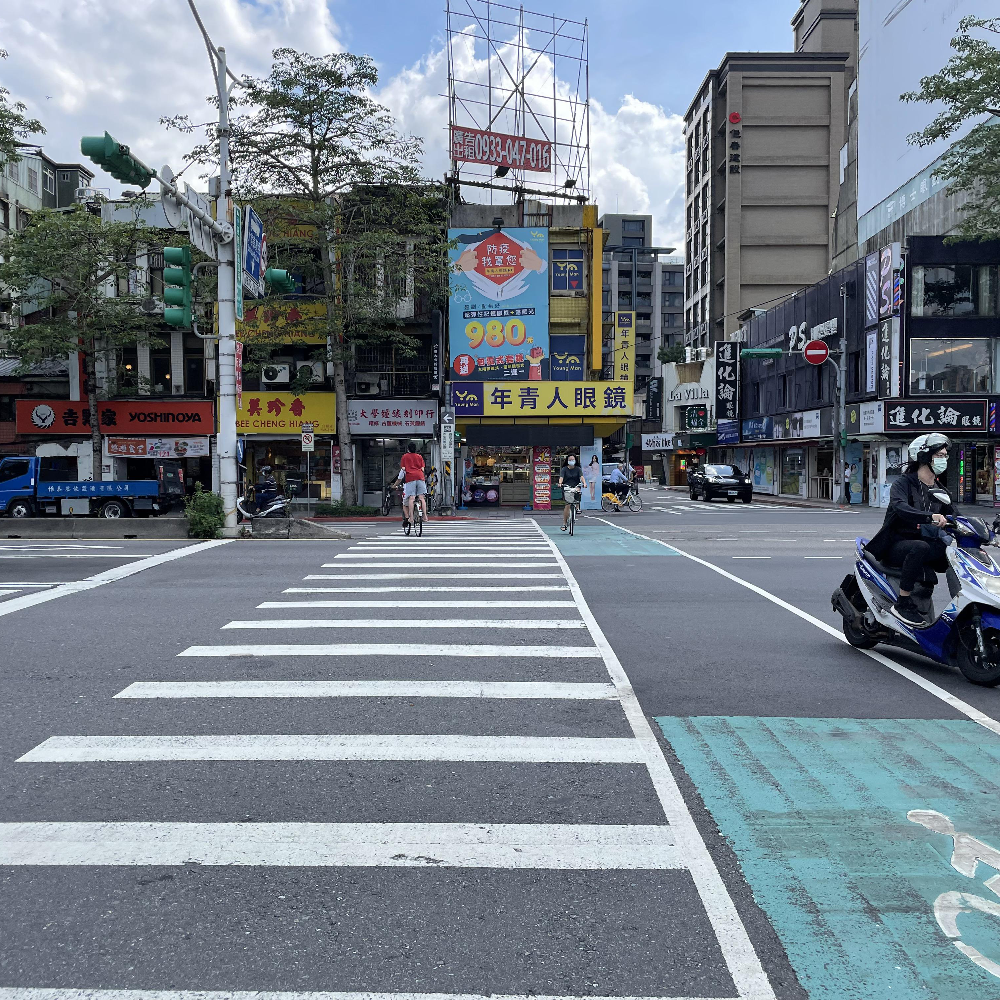

In [14]:
img = Image.open(df.iloc[0]["path"])
w, h = img.size # w = 4000; h = 3000
if h > w:
    img_cropped = img.crop((0, (h-w)/2, w, h-((h-w)/2))) # L, T, R, B
elif w > h:
    img_cropped = img.crop(((w-h)/2, 0, w-((w-h)/2), h))
else:
    pass
img_cropped
# img_cropped.save("test.jpg")

In [15]:
for i in range(len(df)):
    file_path = df.iloc[i]["path"]
    new_path = os.path.join("processed_data", df.iloc[i]["new_filename"])
    print("{} => {}".format(file_path, new_path))
    
    try:
        img = Image.open(file_path)
    
    except Exception as err:
        print("cannot handle {}".format(file_path))
        print(err)
        
    try:
        exif = img._getexif()
        
        for orientation in ExifTags.TAGS.keys():
            if ExifTags.TAGS[orientation]=='Orientation':
                break

        if exif[orientation] == 3:
            img=img.rotate(180, expand=True)
        elif exif[orientation] == 6:
            img=img.rotate(270, expand=True)
        elif exif[orientation] == 8:
            img=img.rotate(90, expand=True)

        img.save(file_path)

    except Exception as err:
        # cases: image don't have getexif
        pass

    w, h = img.size # w = 4000; h = 3000
    if h > w:
        img_cropped = img.crop((0, h-w, w, h)) # L, T, R, B
    elif w > h:
        img_cropped = img.crop(((w-h)/2, 0, w-((w-h)/2), h))
    else:
        pass
    img_resized = img_cropped.resize((1024, 1024))
    img_resized.save(new_path)


V_pic/IMG_7960.jpg => processed_data/000000.jpg
V_pic/IMG_7948.jpg => processed_data/000001.jpg
V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_39.jpg => processed_data/000002.jpg
V_pic/IMG_7747.jpg => processed_data/000003.jpg
V_pic/IMG_7753.jpg => processed_data/000004.jpg
V_pic/IMG_3904.jpg => processed_data/000005.jpg
V_pic/IMG_20210607_202147.jpg => processed_data/000006.jpg
V_pic/IMG_3910.jpg => processed_data/000007.jpg
V_pic/IMG_3938.jpg => processed_data/000008.jpg
V_pic/IMG_20210609_161938.jpg => processed_data/000009.jpg
V_pic/IMG_20210604_153631.jpg => processed_data/000010.jpg
V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_4.jpg => processed_data/000011.jpg
V_pic/IMG_4070.jpg => processed_data/000012.jpg
V_pic/IMG_4064.jpg => processed_data/000013.jpg
V_pic/IMG_8104.jpg => processed_data/000014.jpg
V_pic/IMG_4058.jpg => processed_data/000015.jpg
V_pic/IMG_3870.jpg => processed_data/000016.jpg
V_pic/IMG_20210604_154016.jpg => processed

V_pic/IMG_4089.jpg => processed_data/000150.jpg
V_pic/IMG_20210609_161916.jpg => processed_data/000151.jpg
V_pic/IMG_20210609_161902.jpg => processed_data/000152.jpg
V_pic/IMG_3902.jpg => processed_data/000153.jpg
V_pic/IMG_8102.jpg => processed_data/000154.jpg
V_pic/IMG_3731.jpg => processed_data/000155.jpg
V_pic/IMG_3725.jpg => processed_data/000156.jpg
V_pic/IMG_4062.jpg => processed_data/000157.jpg
V_pic/IMG_3719.jpg => processed_data/000158.jpg
V_pic/IMG_4076.jpg => processed_data/000159.jpg
V_pic/IMG_20210604_151140.jpg => processed_data/000160.jpg
V_pic/IMG_20210604_151154.jpg => processed_data/000161.jpg
V_pic/IMG_8089.jpg => processed_data/000162.jpg
V_pic/IMG_20210610_130624.jpg => processed_data/000163.jpg
V_pic/IMG_3862.jpg => processed_data/000164.jpg
V_pic/IMG_3876.jpg => processed_data/000165.jpg
V_pic/IMG_20210607_202035.jpg => processed_data/000166.jpg
V_pic/IMG_8076.jpg => processed_data/000167.jpg
V_pic/IMG_3889.jpg => processed_data/000168.jpg
V_pic/IMG_8062.jpg => 

V_pic/IMG_20210610_131417.jpg => processed_data/000298.jpg
V_pic/IMG_4013.jpg => processed_data/000299.jpg
V_pic/IMG_3768.jpg => processed_data/000300.jpg
V_pic/IMG_3998.jpg => processed_data/000301.jpg
V_pic/IMG_3813.jpg => processed_data/000302.jpg
V_pic/IMG_8007.jpg => processed_data/000303.jpg
V_pic/IMG_8013.jpg => processed_data/000304.jpg
V_pic/IMG_7877.jpg => processed_data/000305.jpg
V_pic/IMG_20210608_153013.jpg => processed_data/000306.jpg
V_pic/IMG_20210607_202252.jpg => processed_data/000307.jpg
V_pic/IMG_7863.jpg => processed_data/000308.jpg
V_pic/IMG_3393.jpg => processed_data/000309.jpg
V_pic/IMG_3387.jpg => processed_data/000310.jpg
V_pic/IMG_7888.jpg => processed_data/000311.jpg
V_pic/IMG_3350.jpg => processed_data/000312.jpg
V_pic/IMG_3344.jpg => processed_data/000313.jpg
V_pic/IMG_3345.jpg => processed_data/000314.jpg
V_pic/IMG_7889.jpg => processed_data/000315.jpg
V_pic/IMG_3351.jpg => processed_data/000316.jpg
V_pic/IMG_3386.jpg => processed_data/000317.jpg
V_pic/I

V_pic/IMG_7865.jpg => processed_data/000446.jpg
V_pic/IMG_7871.jpg => processed_data/000447.jpg
V_pic/IMG_3430.jpg => processed_data/000448.jpg
V_pic/IMG_3356.jpg => processed_data/000449.jpg
V_pic/IMG_20210609_164212.jpg => processed_data/000450.jpg
V_pic/IMG_3431.jpg => processed_data/000451.jpg
V_pic/IMG_3343.jpg => processed_data/000452.jpg
V_pic/IMG_7870.jpg => processed_data/000453.jpg
V_pic/IMG_20210607_201748.jpg => processed_data/000454.jpg
V_pic/IMG_7864.jpg => processed_data/000455.jpg
V_pic/IMG_20210604_153537.jpg => processed_data/000456.jpg
V_pic/IMG_7858.jpg => processed_data/000457.jpg
V_pic/IMG_8028.jpg => processed_data/000458.jpg
V_pic/IMG_20210609_161627.jpg => processed_data/000459.jpg
V_pic/IMG_8014.jpg => processed_data/000460.jpg
V_pic/IMG_3814.jpg => processed_data/000461.jpg
V_pic/IMG_20210607_202043.jpg => processed_data/000462.jpg
V_pic/IMG_3828.jpg => processed_data/000463.jpg
V_pic/IMG_20210604_153735.jpg => processed_data/000464.jpg
V_pic/IMG_4014.jpg => 

V_pic/IMG_8027.jpg => processed_data/000596.jpg
V_pic/IMG_3614.jpg => processed_data/000597.jpg
V_pic/IMG_20210604_153935.jpg => processed_data/000598.jpg
V_pic/IMG_20210604_153921.jpg => processed_data/000599.jpg
V_pic/IMG_3827.jpg => processed_data/000600.jpg
V_pic/IMG_3774.jpg => processed_data/000601.jpg
V_pic/IMG_3990.jpg => processed_data/000602.jpg
V_pic/IMG_4027.jpg => processed_data/000603.jpg
V_pic/IMG_3984.jpg => processed_data/000604.jpg
V_pic/IMG_4033.jpg => processed_data/000605.jpg
V_pic/IMG_3953.jpg => processed_data/000606.jpg
V_pic/IMG_20210608_153345.jpg => processed_data/000607.jpg
V_pic/IMG_3947.jpg => processed_data/000608.jpg
V_pic/IMG_7710.jpg => processed_data/000609.jpg
V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_85.jpg => processed_data/000610.jpg
V_pic/IMG_7738.jpg => processed_data/000611.jpg
V_pic/S__72155158.jpg => processed_data/000612.jpg
V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_46.jpg => processed_data/0

V_pic/IMG_7878.jpg => processed_data/000738.jpg
V_pic/IMG_20210604_153503.jpg => processed_data/000739.jpg
V_pic/IMG_7844.jpg => processed_data/000740.jpg
V_pic/IMG_7850.jpg => processed_data/000741.jpg
V_pic/IMG_20210608_155445.jpg => processed_data/000742.jpg
V_pic/IMG_3388.jpg => processed_data/000743.jpg
V_pic/IMG_7887.jpg => processed_data/000744.jpg
V_pic/IMG_7893.jpg => processed_data/000745.jpg
V_pic/IMG_20210609_164233.jpg => processed_data/000746.jpg
V_pic/IMG_7892.jpg => processed_data/000747.jpg
V_pic/IMG_7886.jpg => processed_data/000748.jpg
V_pic/IMG_7851.jpg => processed_data/000749.jpg
V_pic/IMG_3389.jpg => processed_data/000750.jpg
V_pic/IMG_7845.jpg => processed_data/000751.jpg
V_pic/IMG_7879.jpg => processed_data/000752.jpg
V_pic/IMG_8009.jpg => processed_data/000753.jpg
V_pic/IMG_8021.jpg => processed_data/000754.jpg
V_pic/IMG_8035.jpg => processed_data/000755.jpg
V_pic/IMG_20210608_153551.jpg => processed_data/000756.jpg
V_pic/S__72155214.jpg => processed_data/0007

V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_105.jpg => processed_data/000884.jpg
V_pic/IMG_20210607_201725.jpg => processed_data/000885.jpg
V_pic/IMG_3474.jpg => processed_data/000886.jpg
V_pic/IMG_3307.jpg => processed_data/000887.jpg
V_pic/IMG_3475.jpg => processed_data/000888.jpg
V_pic/IMG_20210604_151402.jpg => processed_data/000889.jpg
V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_104.jpg => processed_data/000890.jpg
V_pic/IMG_20210608_153044.jpg => processed_data/000891.jpg
V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_110.jpg => processed_data/000892.jpg
V_pic/IMG_8050.jpg => processed_data/000893.jpg
V_pic/IMG_20210608_152819.jpg => processed_data/000894.jpg
V_pic/IMG_8044.jpg => processed_data/000895.jpg
V_pic/IMG_20210604_153956.jpg => processed_data/000896.jpg
V_pic/IMG_3887.jpg => processed_data/000897.jpg
V_pic/IMG_3893.jpg => processed_data/000898.jpg
V_pic/IMG_8078.jpg => processed_data/000899.jpg
V_pic/IMG

V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_117.jpg => processed_data/001031.jpg
V_pic/IMG_3314.jpg => processed_data/001032.jpg
V_pic/IMG_3472.jpg => processed_data/001033.jpg
V_pic/IMG_3328.jpg => processed_data/001034.jpg
V_pic/IMG_3329.jpg => processed_data/001035.jpg
V_pic/IMG_20210609_164245.jpg => processed_data/001036.jpg
V_pic/IMG_3315.jpg => processed_data/001037.jpg
V_pic/IMG_3473.jpg => processed_data/001038.jpg
V_pic/IMG_3467.jpg => processed_data/001039.jpg
V_pic/o013ec39f7e3ed313e7085914aa1cee71_4620693218545359526_210610_102.jpg => processed_data/001040.jpg
V_pic/IMG_3498.jpg => processed_data/001041.jpg
V_pic/IMG_20210607_202559.jpg => processed_data/001042.jpg
V_pic/IMG_3895.jpg => processed_data/001043.jpg
V_pic/IMG_8042.jpg => processed_data/001044.jpg
V_pic/IMG_8056.jpg => processed_data/001045.jpg
V_pic/S__72155288.jpg => processed_data/001046.jpg
V_pic/IMG_8081.jpg => processed_data/001047.jpg
V_pic/IMG_8095.jpg => processed_data/001048.jpg

# Final data

In [ ]:
df_re = pd.concat([df, df_sampled], axis=0)
df_reserved = df_re.drop_duplicates(subset=['split_filename'],keep=False)
df_reserved

In [17]:
df_final_sampled = df.merge(df_sampled[['split_filename', 'subset']], on="split_filename")
df_final_sampled

,path,filename,split_filename,original_filename,new_filename,safetowalk,timetowalk,subset
0,V_pic/IMG_7960.jpg,IMG_7960.jpg,IMG_7960,IMG_7960.HEIC,000000.jpg,1,32.1,train
1,V_pic/IMG_7948.jpg,IMG_7948.jpg,IMG_7948,IMG_7948.HEIC,000001.jpg,1,32.6,train
2,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,000002.jpg,0,8.8,train
3,V_pic/IMG_7747.jpg,IMG_7747.jpg,IMG_7747,IMG_7747.jpeg,000003.jpg,1,7.8,train
4,V_pic/IMG_7753.jpg,IMG_7753.jpg,IMG_7753,IMG_7753.jpeg,000004.jpg,0,12.2,train
...,...,...,...,...,...,...,...,...
1065,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,001143.jpg,0,13.2,train
1066,V_pic/IMG_7951.jpg,IMG_7951.jpg,IMG_7951,IMG_7951.HEIC,001144.jpg,0,9.2,train
1067,V_pic/IMG_7945.jpg,IMG_7945.jpg,IMG_7945,IMG_7945.HEIC,001145.jpg,1,8.4,train
1068,V_pic/IMG_7979.jpg,IMG_7979.jpg,IMG_7979,IMG_7979.HEIC,001146.jpg,0,32.1,train


In [18]:
df_1148 = pd.concat((df_final_sampled, df_reserved), axis=0).reset_index(drop=True)
df_1148

,path,filename,split_filename,original_filename,new_filename,safetowalk,timetowalk,subset
0,V_pic/IMG_7960.jpg,IMG_7960.jpg,IMG_7960,IMG_7960.HEIC,000000.jpg,1,32.1,train
1,V_pic/IMG_7948.jpg,IMG_7948.jpg,IMG_7948,IMG_7948.HEIC,000001.jpg,1,32.6,train
2,V_pic/o013ec39f7e3ed313e7085914aa1cee71_462069...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,o013ec39f7e3ed313e7085914aa1cee71_462069321854...,000002.jpg,0,8.8,train
3,V_pic/IMG_7747.jpg,IMG_7747.jpg,IMG_7747,IMG_7747.jpeg,000003.jpg,1,7.8,train
4,V_pic/IMG_7753.jpg,IMG_7753.jpg,IMG_7753,IMG_7753.jpeg,000004.jpg,0,12.2,train
...,...,...,...,...,...,...,...,...
1143,V_pic/IMG_8083.jpg,IMG_8083.jpg,IMG_8083,IMG_8083.HEIC,001090.jpg,0,14.1,NaN
1144,V_pic/IMG_4108.jpg,IMG_4108.jpg,IMG_4108,IMG_4108.HEIC,001097.jpg,0,35.2,NaN
1145,V_pic/IMG_20210608_153901.jpg,IMG_20210608_153901.jpg,IMG_20210608_153901,IMG_20210608_153901.jpg,001109.jpg,0,33.4,NaN
1146,V_pic/IMG_20210610_130808.jpg,IMG_20210610_130808.jpg,IMG_20210610_130808,IMG_20210610_130808.jpg,001119.jpg,0,36.3,NaN


In [19]:
# df_1148.drop_duplicates(subset="new_filename")  # Check

In [20]:
df_1148 = df_1148.fillna(value={"subset": "reserved"})

In [21]:
df_1148.to_csv('final_data.csv')

In [28]:
df_1148.to_excel('final_data.xlsx')

##  matploblib

In [ ]:
fig = plt.figure()
plt.hist(df_train.query("safetowalk == 0")["timetowalk"], numpy.linspace(0, 65, 21), alpha=0.3, facecolor="r", label="not safe")
plt.hist(df_train.query("safetowalk == 1")["timetowalk"], numpy.linspace(0, 65, 21), alpha=0.3, facecolor="g", label="safe")
plt.xlabel("width of road (meters)")
plt.ylabel("counts")

plt.title("Training Data Distribution")
plt.legend()
plt.savefig("training_data_stats.png")

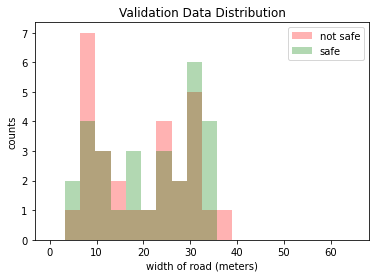

In [47]:
fig = plt.figure()
plt.hist(df_val.query("safetowalk == 0")["timetowalk"], numpy.linspace(0, 65, 21), alpha=0.3, facecolor="r", label="not safe")
plt.hist(df_val.query("safetowalk == 1")["timetowalk"], numpy.linspace(0, 65, 21), alpha=0.3, facecolor="g", label="safe")
plt.xlabel("width of road (meters)")
plt.ylabel("counts")

plt.title("Validation Data Distribution")
plt.legend()
plt.savefig("validation_data_stats.png")

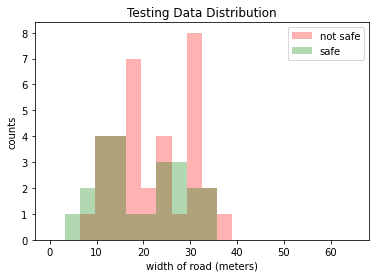

In [48]:
fig = plt.figure()
plt.hist(df_test.query("safetowalk == 0")["timetowalk"], numpy.linspace(0, 65, 21), alpha=0.3, facecolor="r", label="not safe")
plt.hist(df_test.query("safetowalk == 1")["timetowalk"], numpy.linspace(0, 65, 21), alpha=0.3, facecolor="g", label="safe")
plt.xlabel("width of road (meters)")
plt.ylabel("counts")

plt.title("Testing Data Distribution")
plt.legend()
plt.savefig("testing_data_stats.png")

,safetowalk,timetowalk
count,956.000000,956.000000
mean,0.505230,19.488128
std,0.500234,9.863976
min,0.000000,4.400000
25%,0.000000,11.000000
50%,1.000000,18.500000
75%,1.000000,26.500000
max,1.000000,59.100000


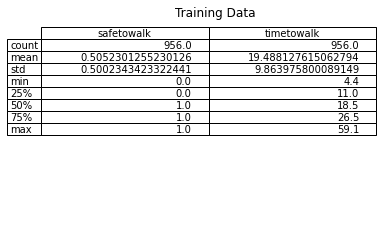

In [25]:
training_desc = df_train.describe()

#create a subplot without frame
plot = plt.subplot(111, frame_on=False)

#remove axis
plot.xaxis.set_visible(False) 
plot.yaxis.set_visible(False) 

#create the table plot and position it in the upper left corner
table(plot, training_desc, loc='upper right')

plt.title("Training Data")

#save the plot as a png file
plt.savefig('training_desc.png')

df_train.describe()

,safetowalk,timetowalk
count,57.000000,57.000000
mean,0.508772,20.256140
std,0.504367,10.289992
min,0.000000,5.400000
25%,0.000000,9.900000
50%,1.000000,22.600000
75%,1.000000,31.200000
max,1.000000,36.300000


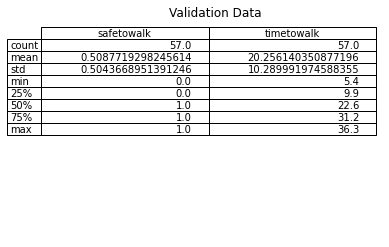

In [26]:
val_desc = df_val.describe()

#create a subplot without frame
plot = plt.subplot(111, frame_on=False)

#remove axis
plot.xaxis.set_visible(False) 
plot.yaxis.set_visible(False) 

#create the table plot and position it in the upper left corner
table(plot, val_desc, loc='upper right')

plt.title("Validation Data")

#save the plot as a png file
plt.savefig('validation_desc.png')

df_val.describe()

,safetowalk,timetowalk
count,57.000000,57.000000
mean,0.403509,21.166667
std,0.494962,8.542903
min,0.000000,4.900000
25%,0.000000,14.300000
50%,0.000000,20.000000
75%,1.000000,29.800000
max,1.000000,36.300000


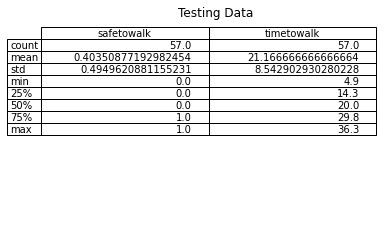

In [27]:
testing_desc = df_test.describe()

#create a subplot without frame
plot = plt.subplot(111, frame_on=False)

#remove axis
plot.xaxis.set_visible(False) 
plot.yaxis.set_visible(False) 

#create the table plot and position it in the upper left corner
table(plot, testing_desc, loc='upper right')

plt.title("Testing Data")

#save the plot as a png file
plt.savefig('testing_desc.png')

df_test.describe()